In [1]:
import pandas as pd
import numpy as np
from scipy import stats as sp
import matplotlib.pyplot as plt
import sys, os
import csv
import warnings 
warnings.filterwarnings('ignore')
sys.path.append('../../')

from lib.utils import trace_processing
from lib.analysis import trace_statistics
from lib.visualization import data_visualization



# Plots

We plot useful informations like the distrubution of standard values, outliers and tumbling windows

In [2]:
plots = set()
with open('traces/traces.csv') as csv_file:
    csv_reader = csv.reader(csv_file, delimiter=',')
    line_count = 0
    for row in csv_reader:
        if line_count == 0:
            line_count += 1
            continue
        else:
            plots.add((row[1], row[2]))

plots = list(plots)

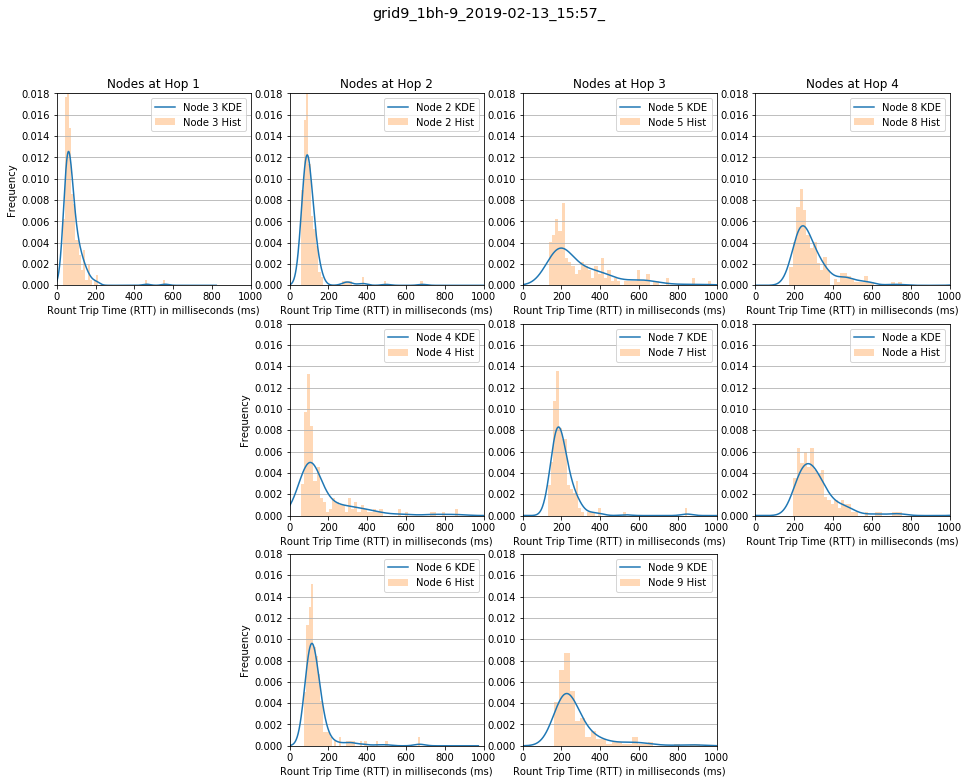

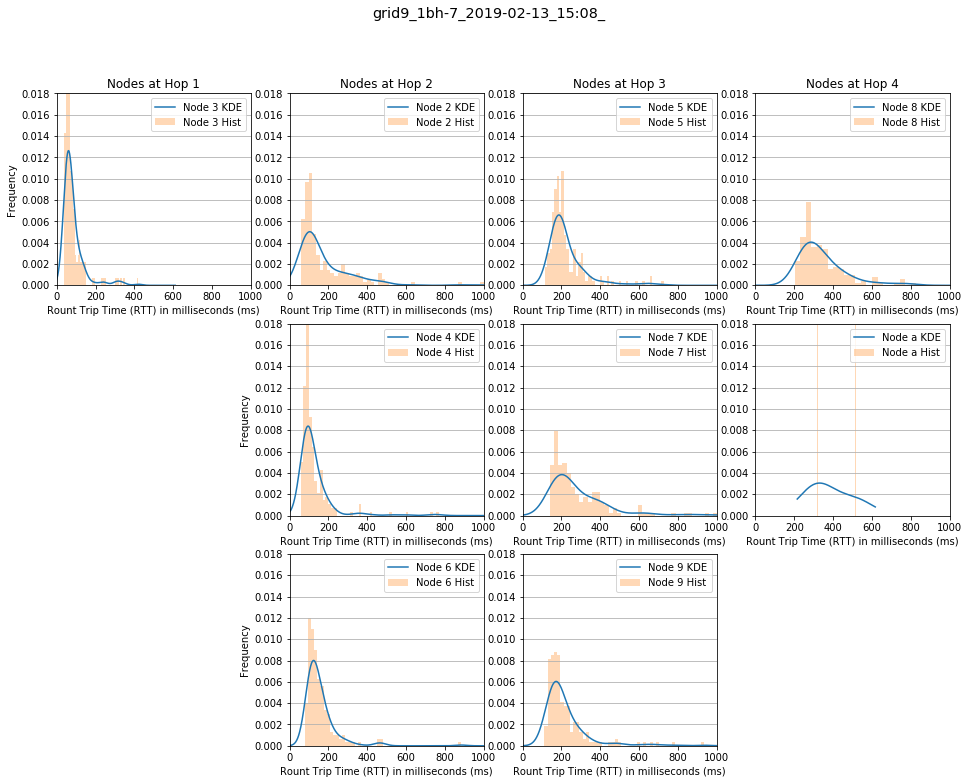

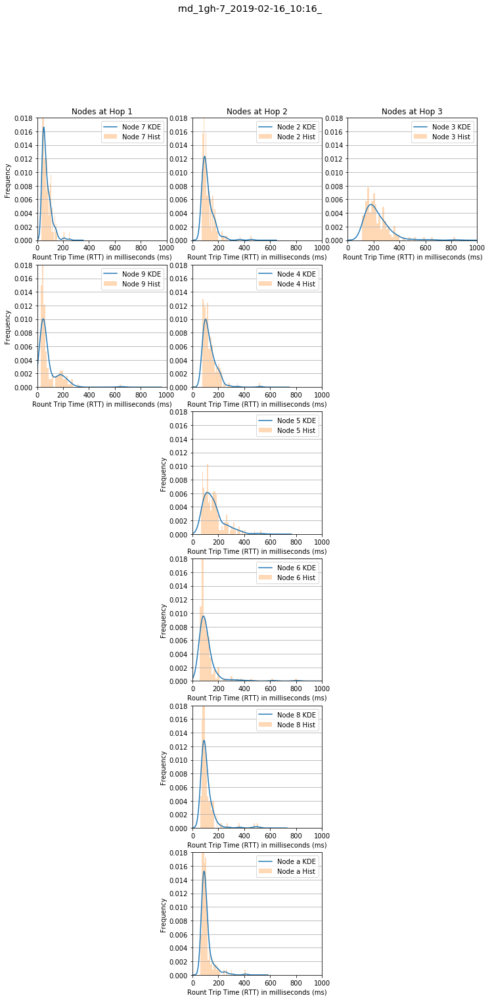

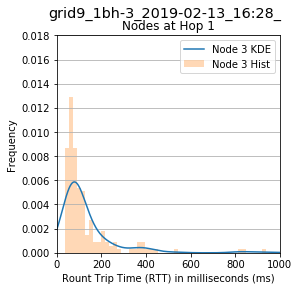

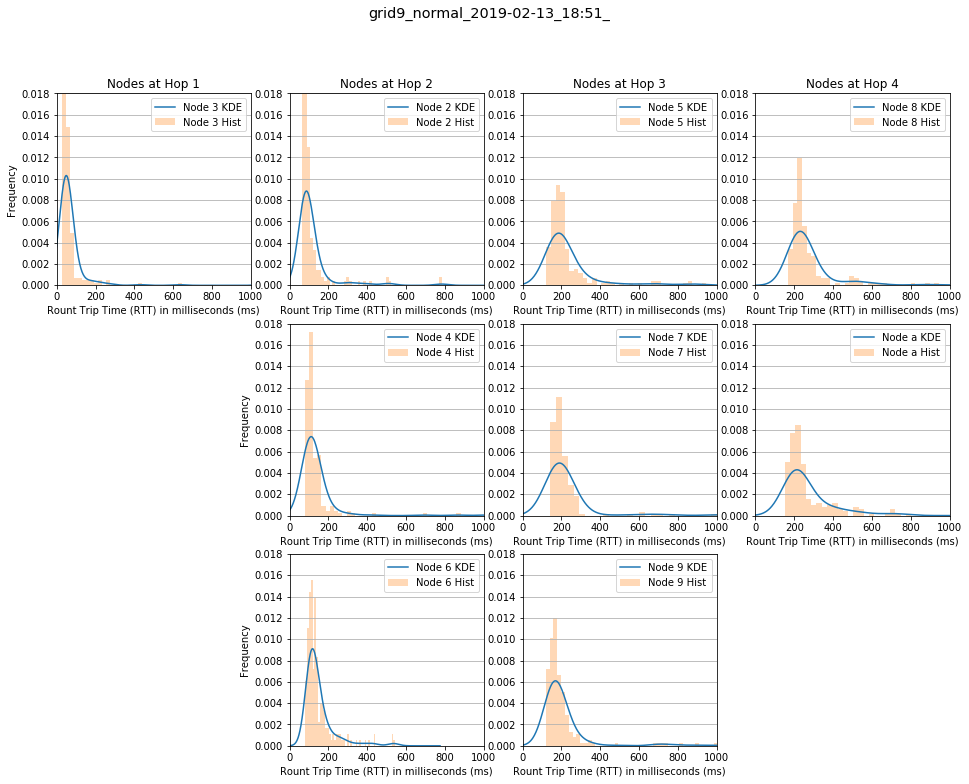

...

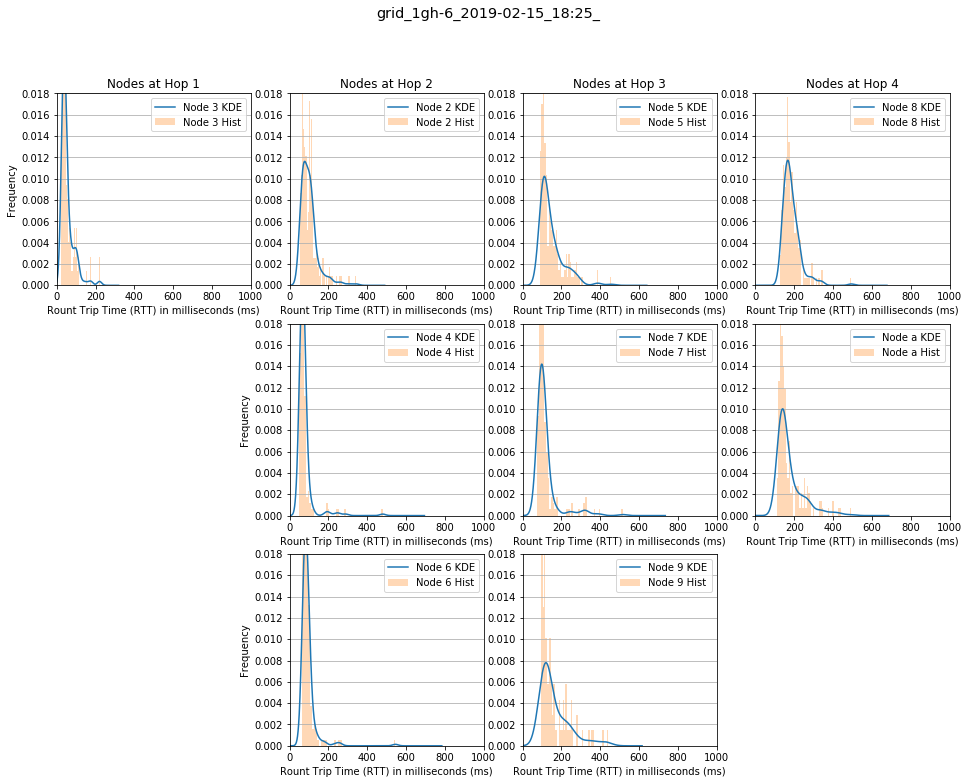

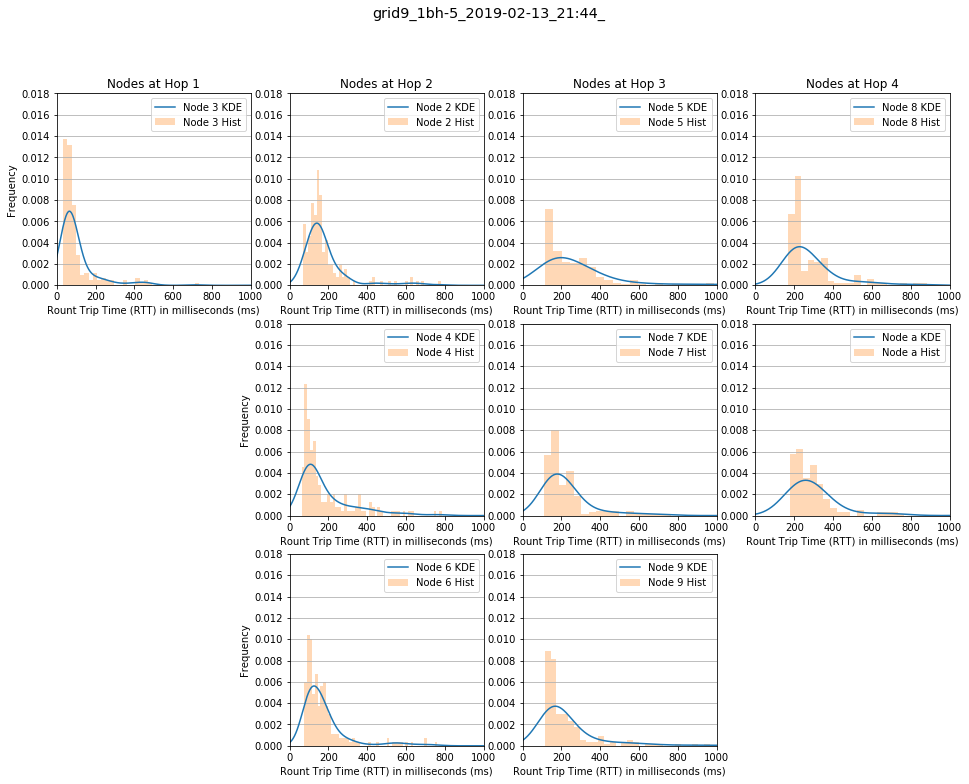

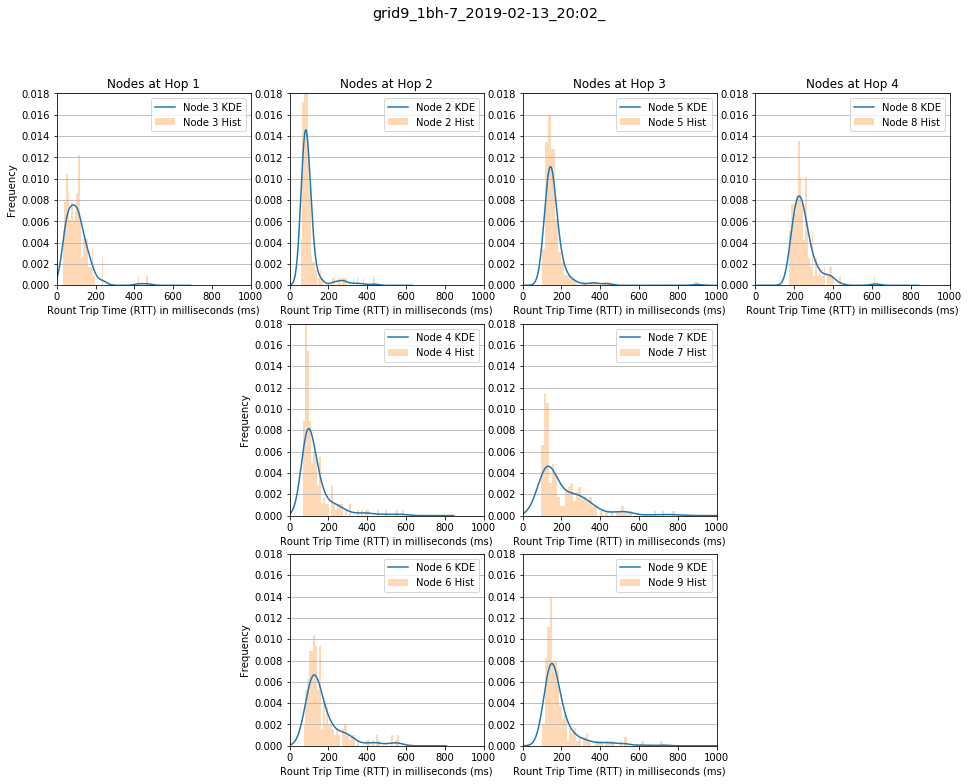

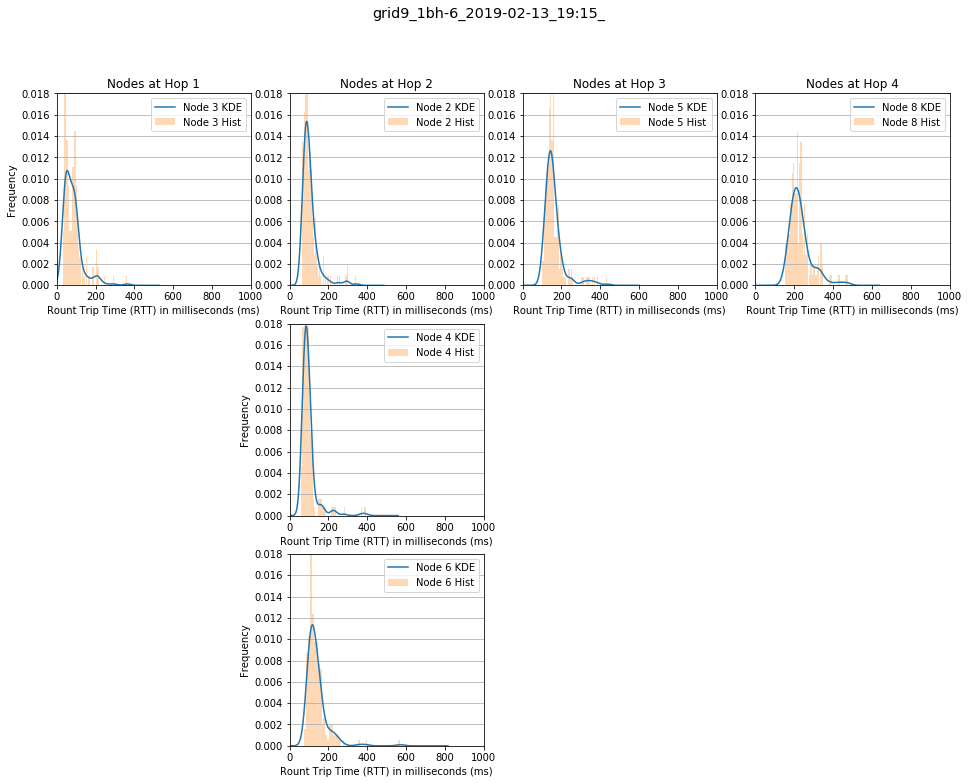

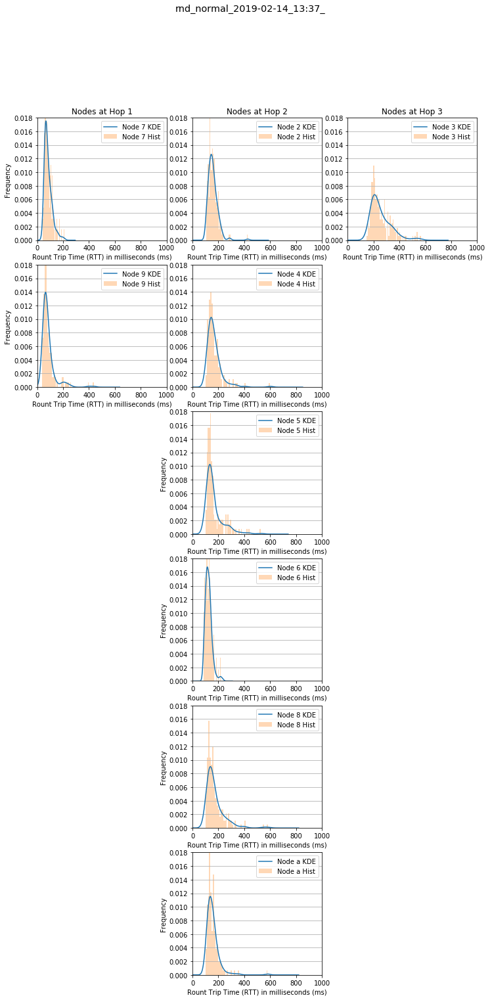

In [3]:
for row in plots:
    nodes, packets_node = trace_processing.process_cooja_traces(row[0], row[1])
    #clean = trace_analysis.separate_outliers_by_node(packets_node)
    plots_analysis.plot_histograms_hops_nodes(nodes, packets_node, 1000, 0.018, row[1])

Tumbling windows

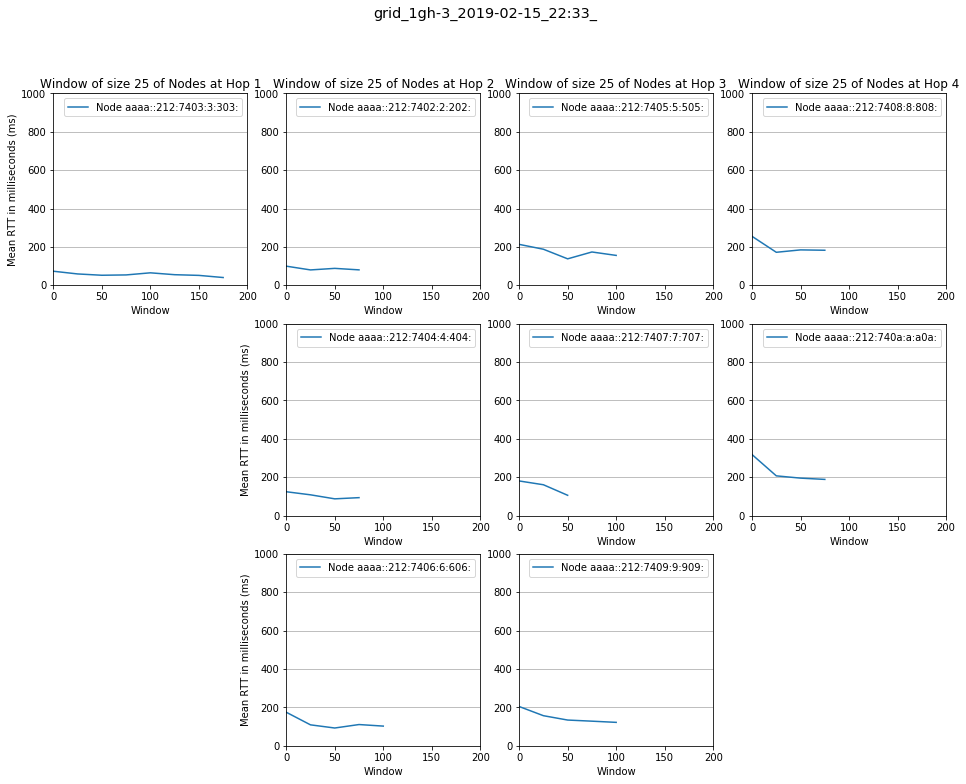

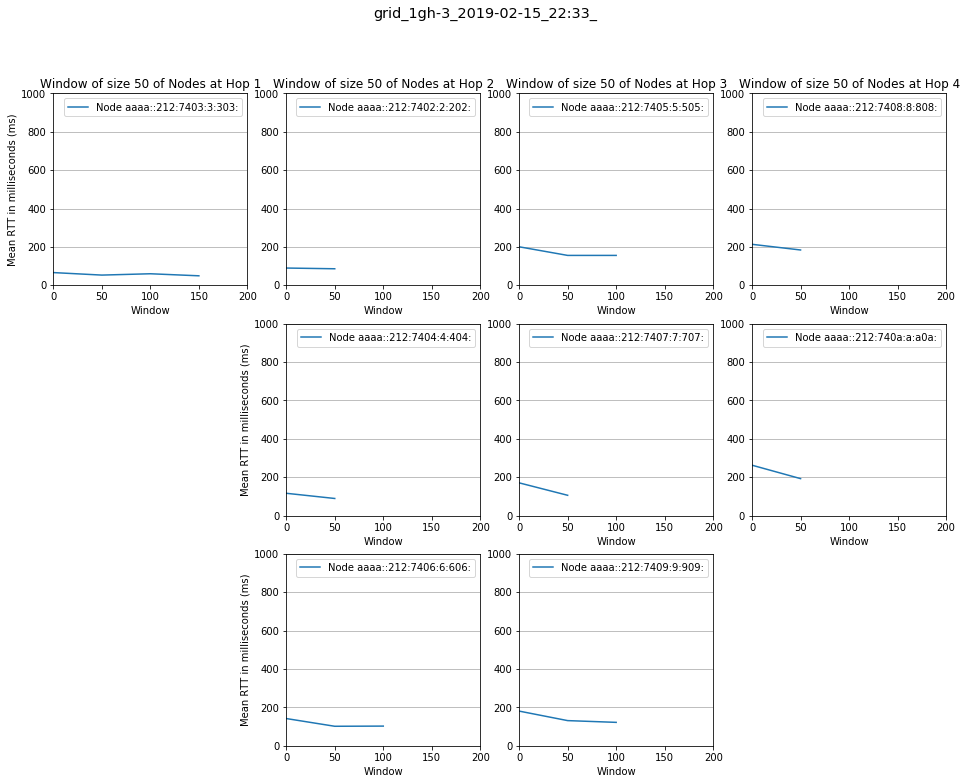

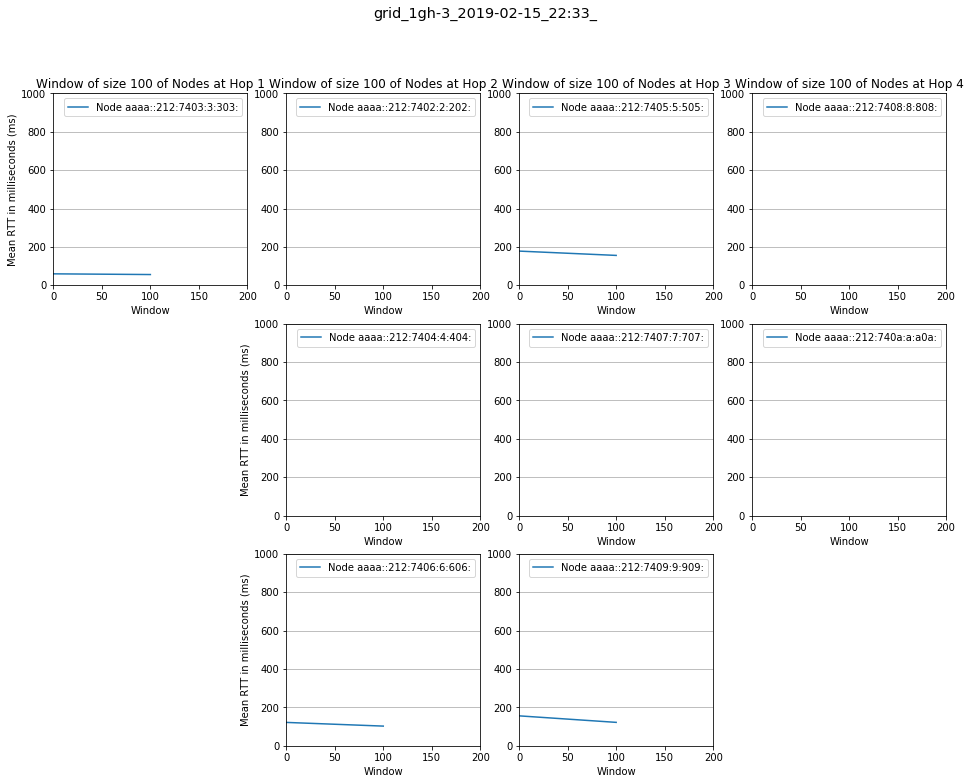

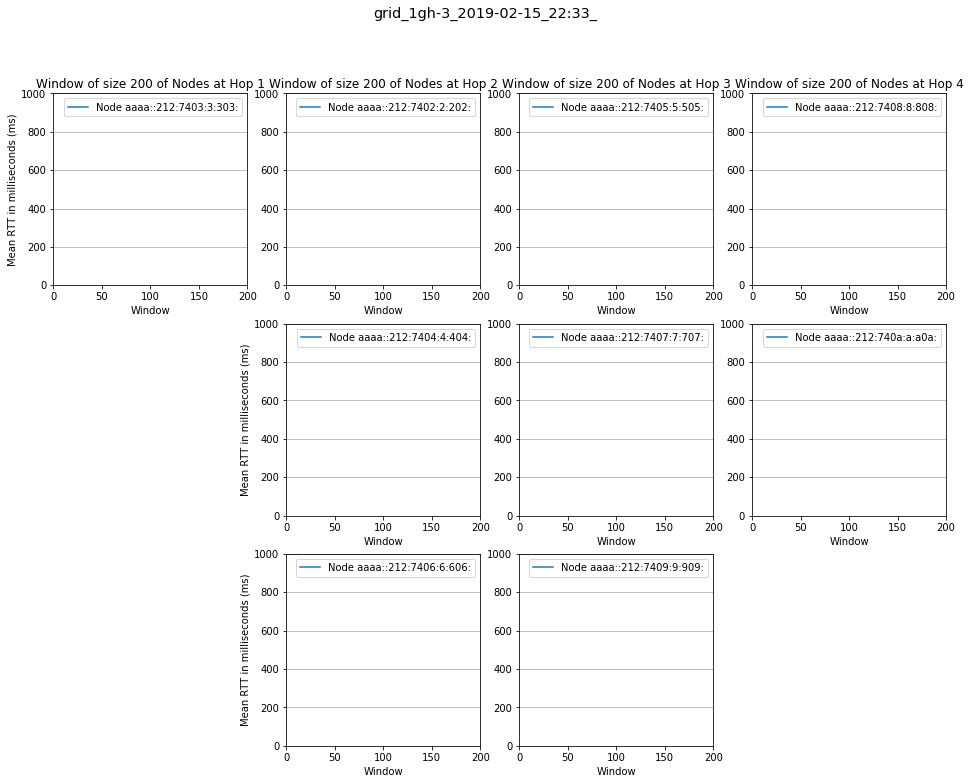

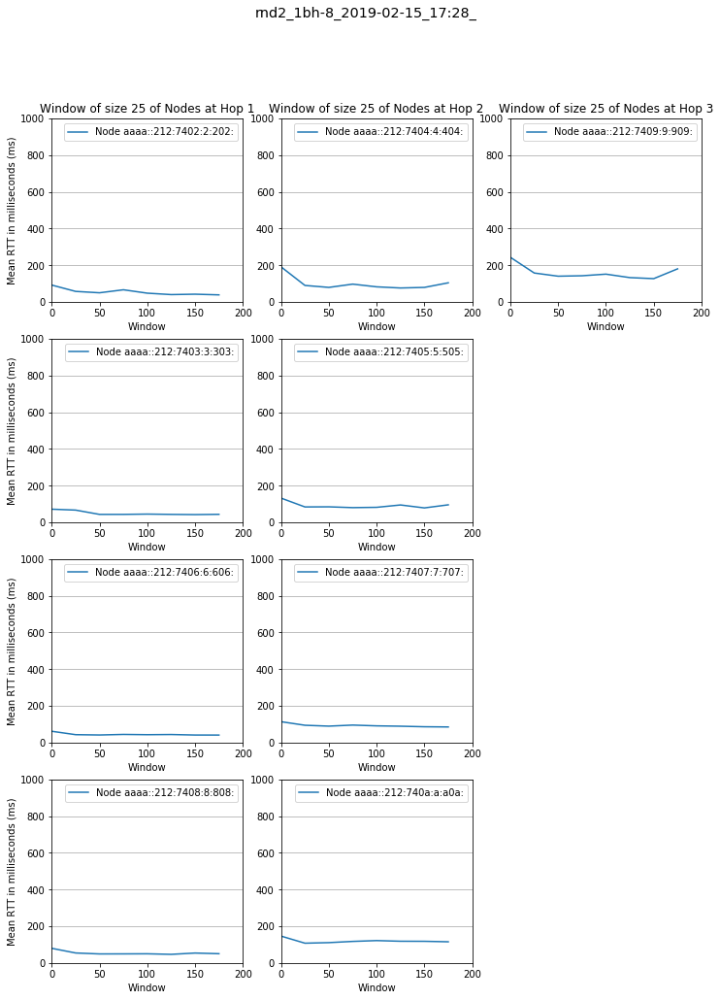

...

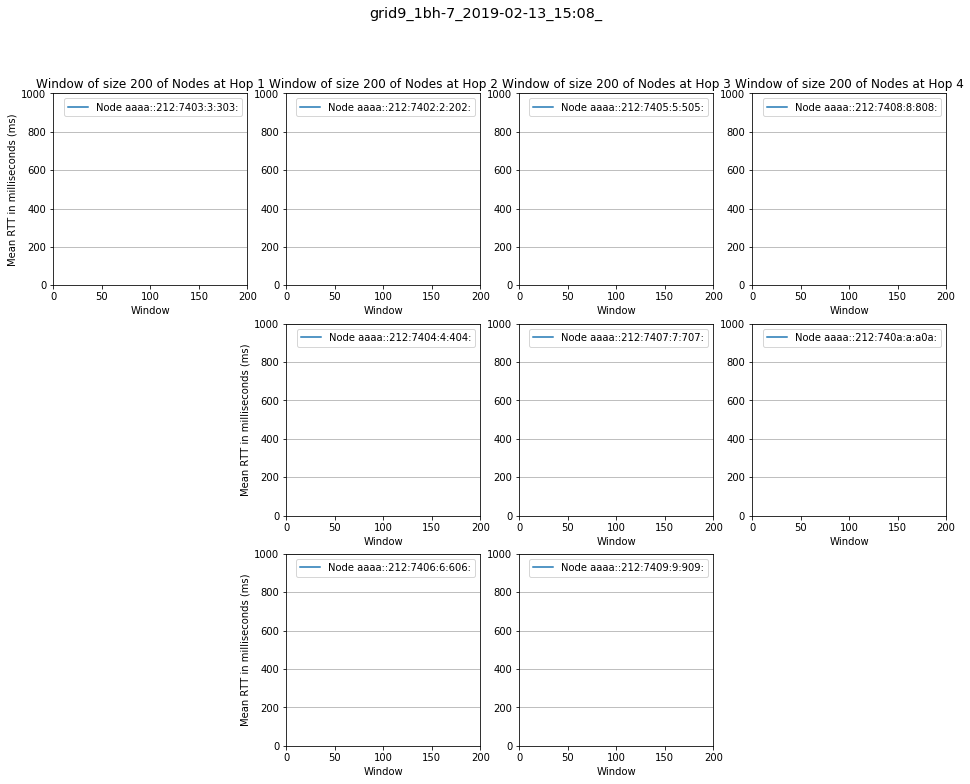

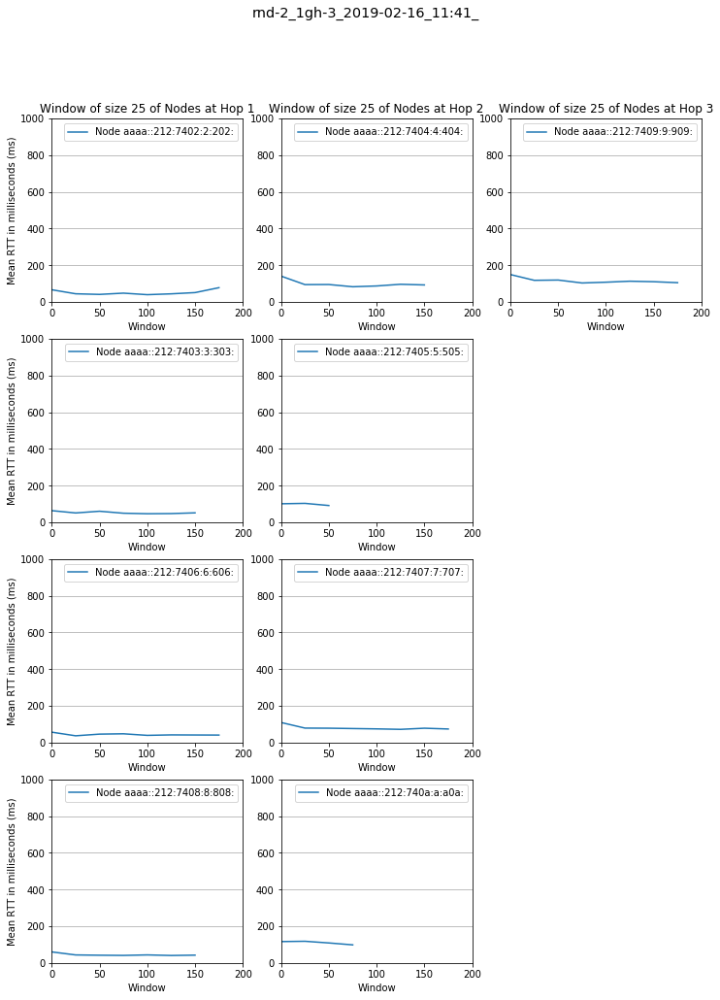

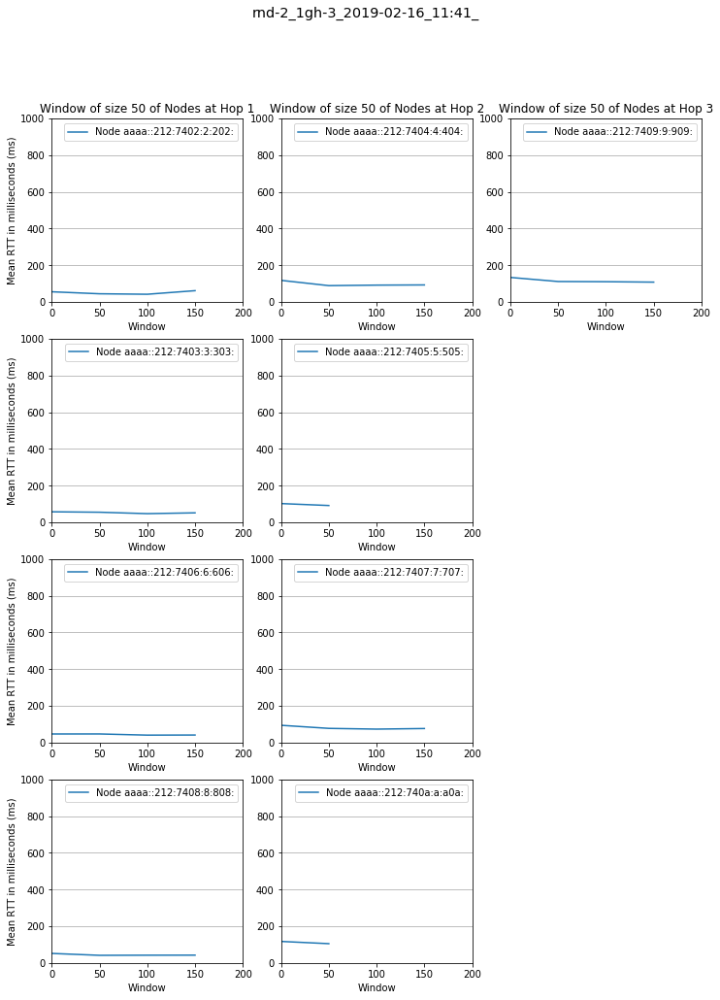

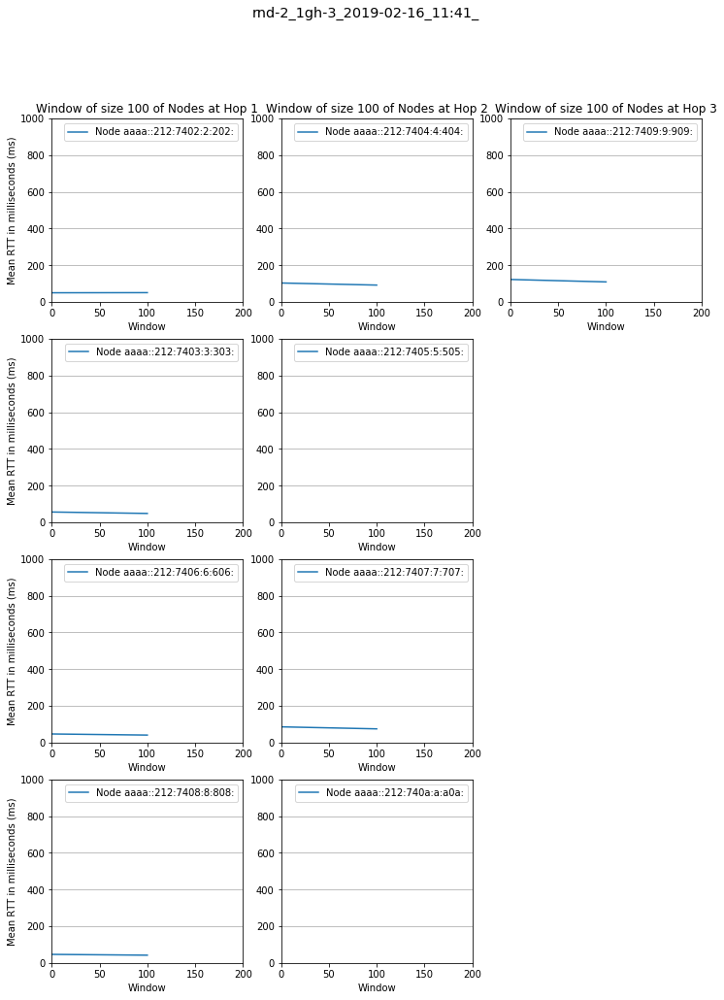

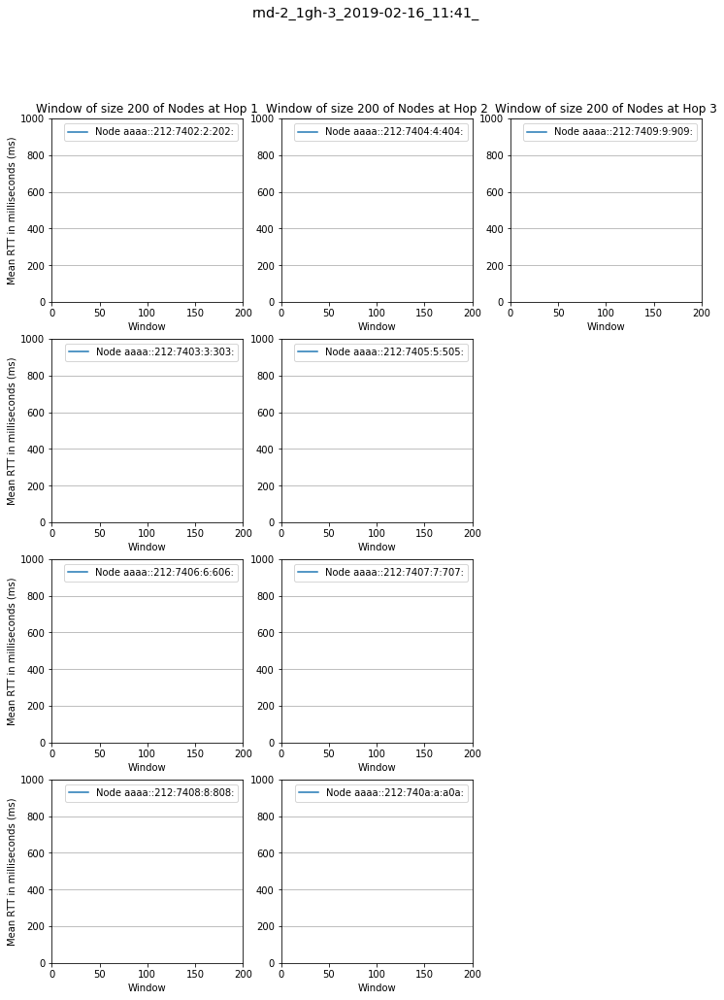

In [5]:
for row in plots:
    nodes, packets_node = trace_analysis.process_cooja2_traces(row[0], row[1])
    plots_analysis.plot_tumbling_windows_hops_nodes(nodes, packets_node, 200, 1000, row[1], 25)
    plots_analysis.plot_tumbling_windows_hops_nodes(nodes, packets_node, 200, 1000, row[1], 50)
    plots_analysis.plot_tumbling_windows_hops_nodes(nodes, packets_node, 200, 1000, row[1], 100)
    plots_analysis.plot_tumbling_windows_hops_nodes(nodes, packets_node, 200, 1000, row[1], 200)



Outliers => points our of mean-2std <= x(t) <= mean + 2std

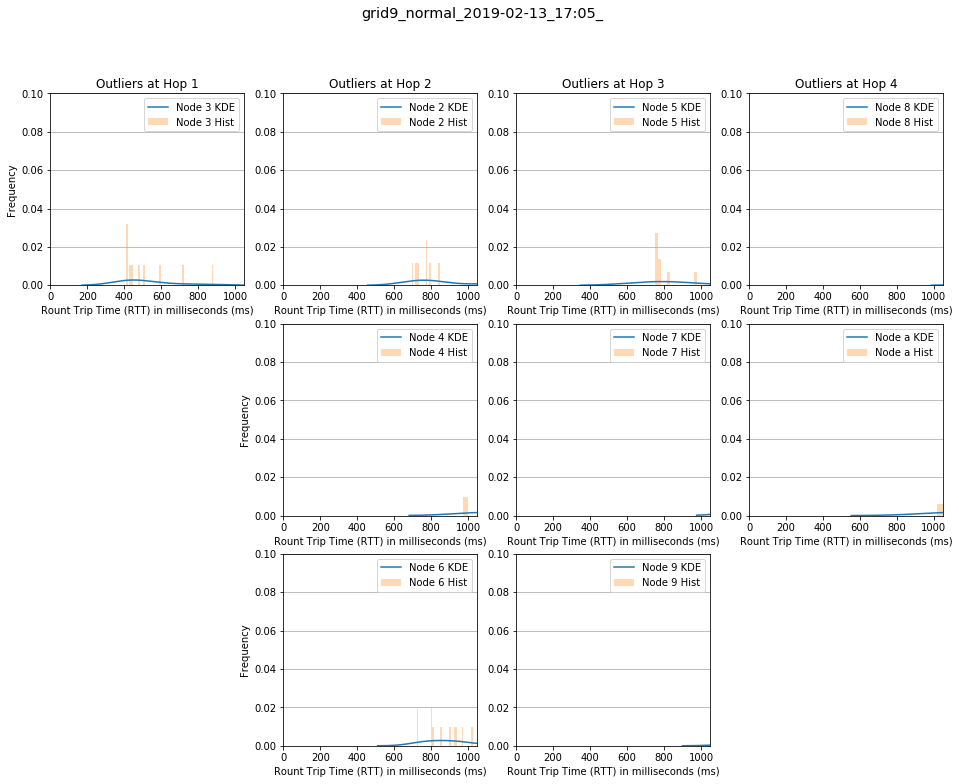

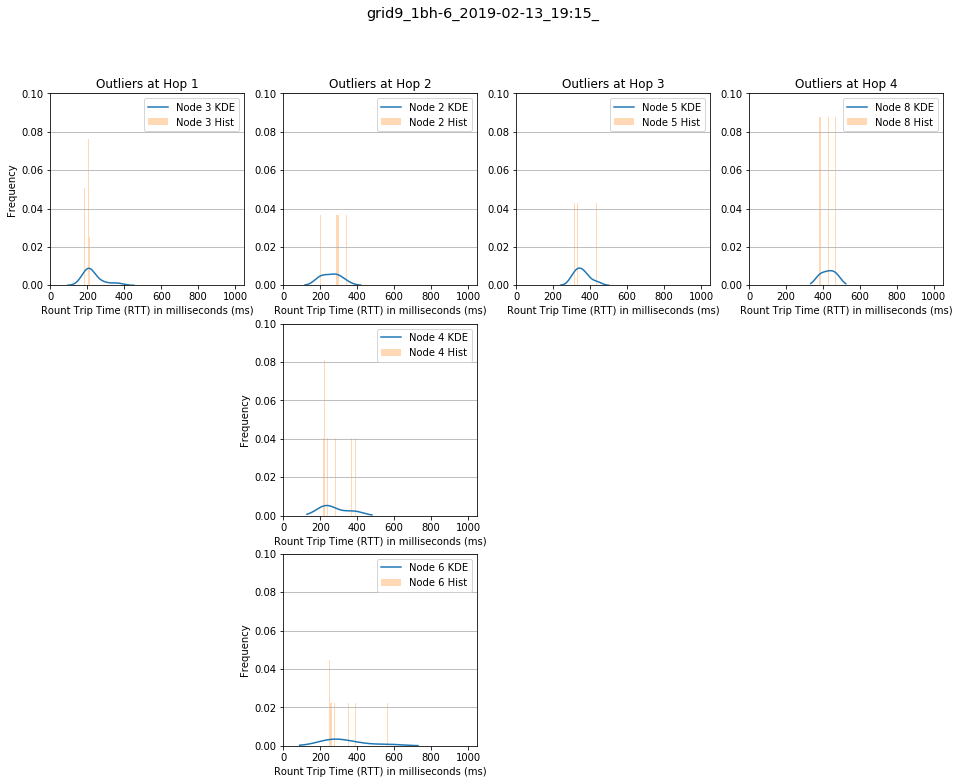

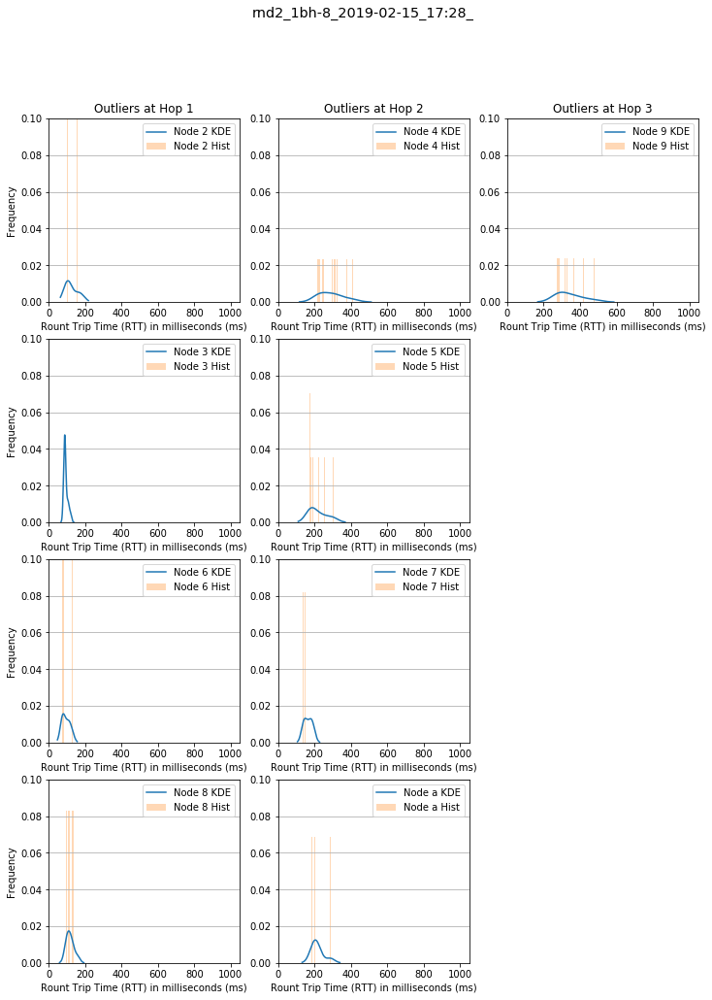

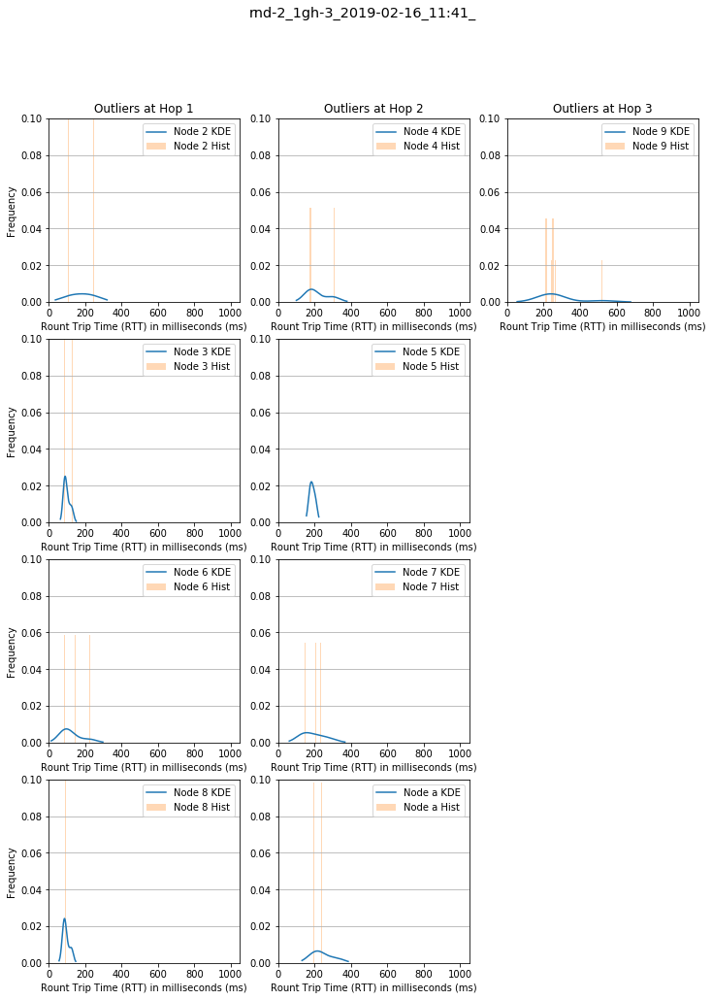

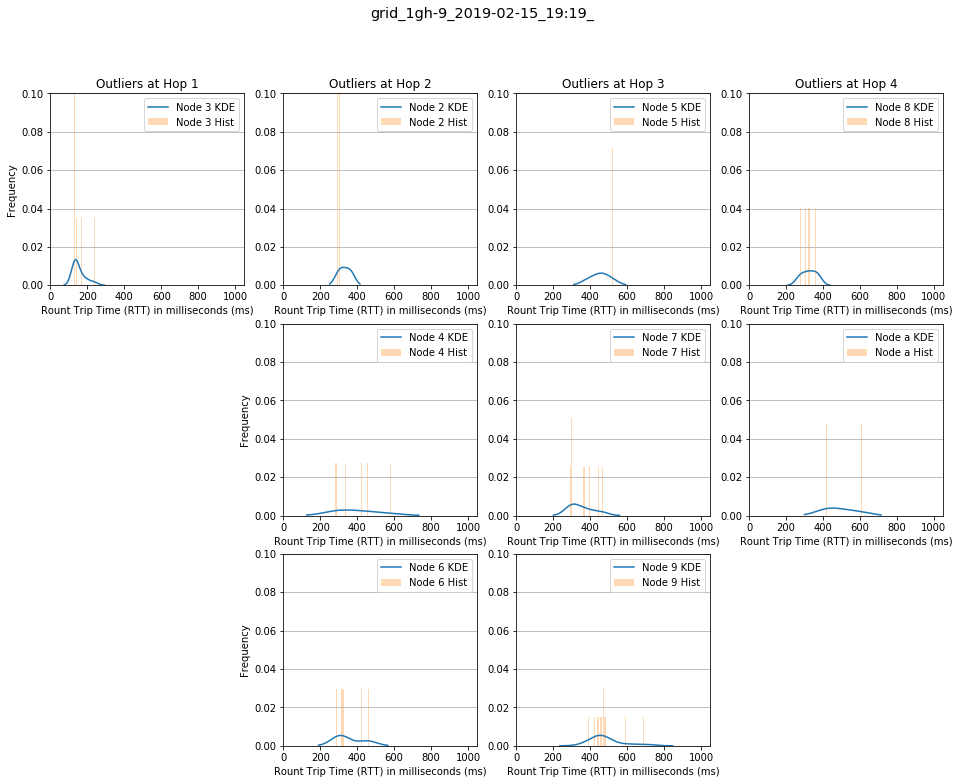

...

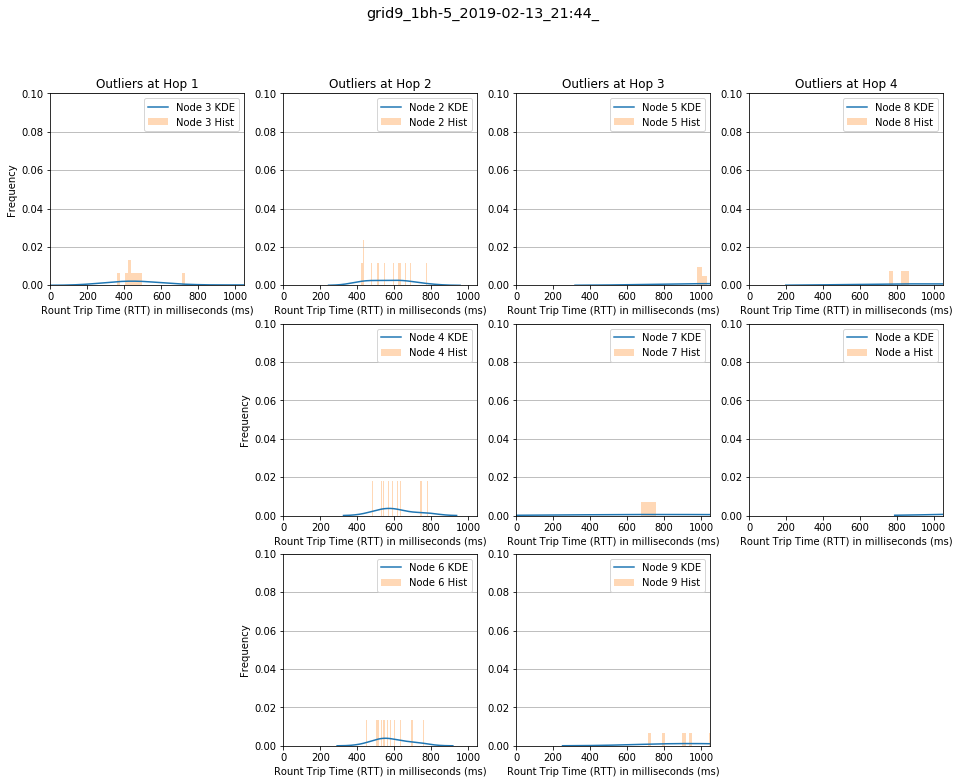

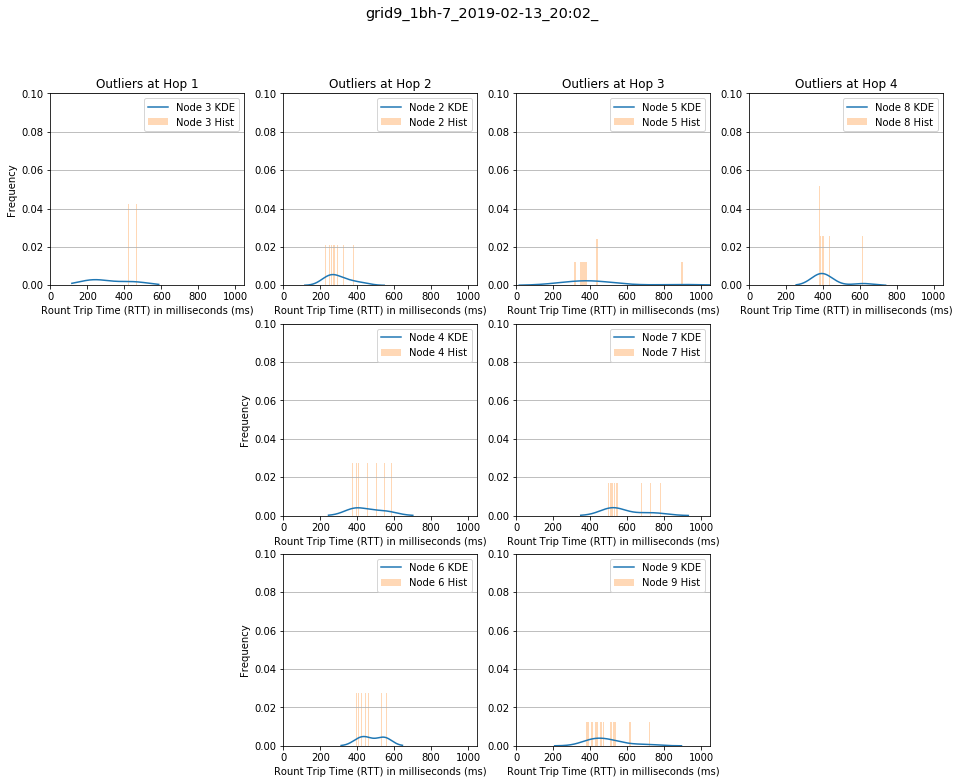

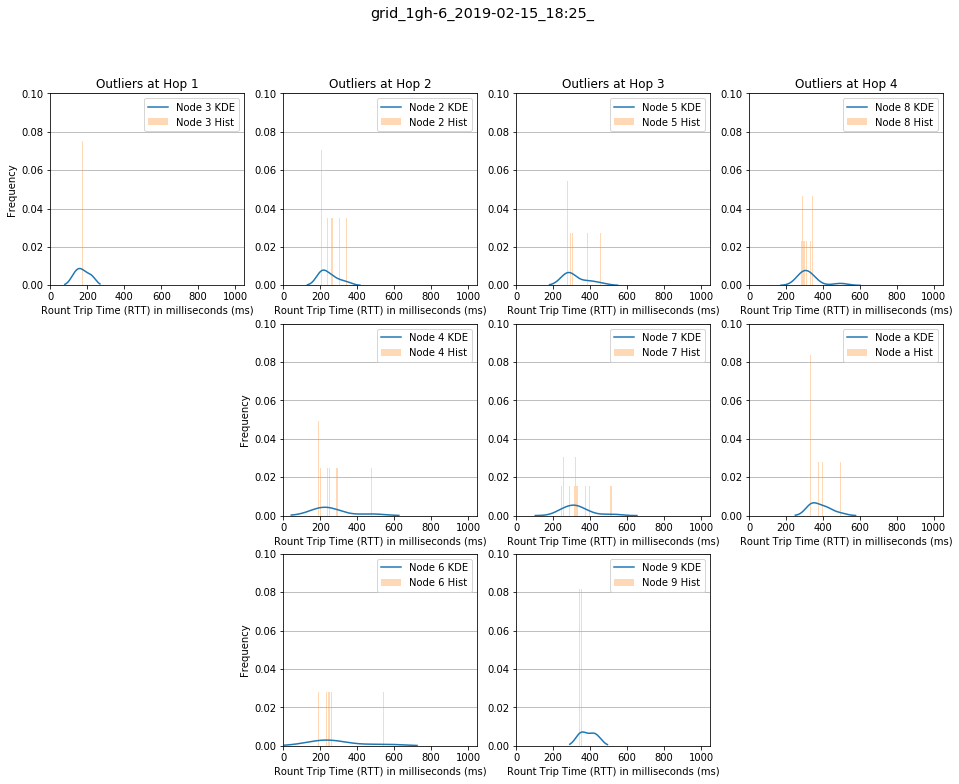

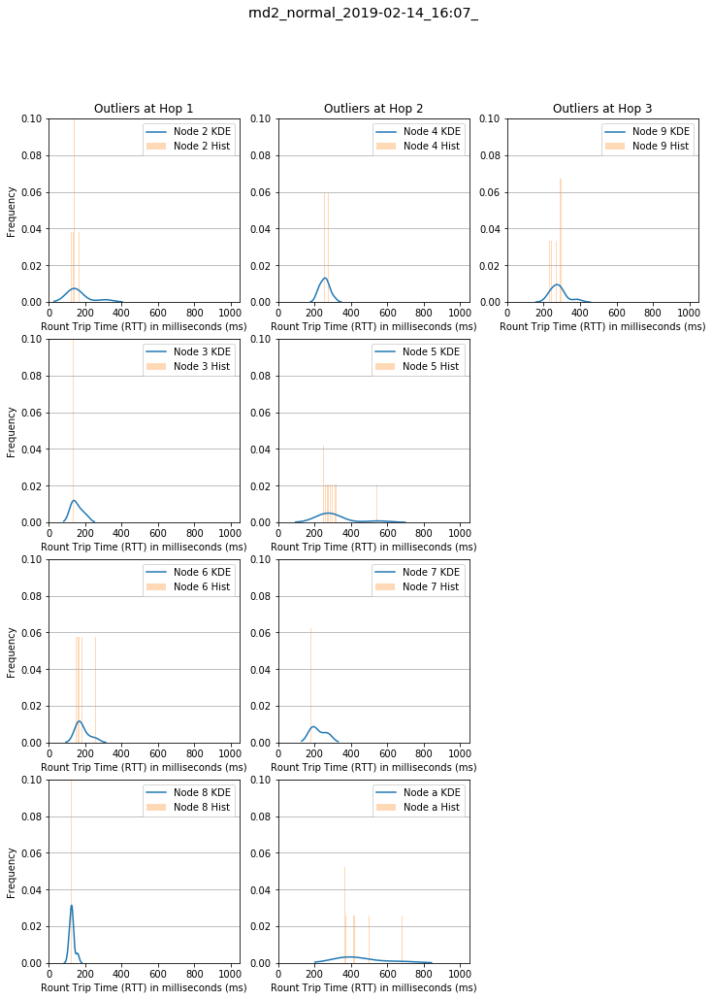

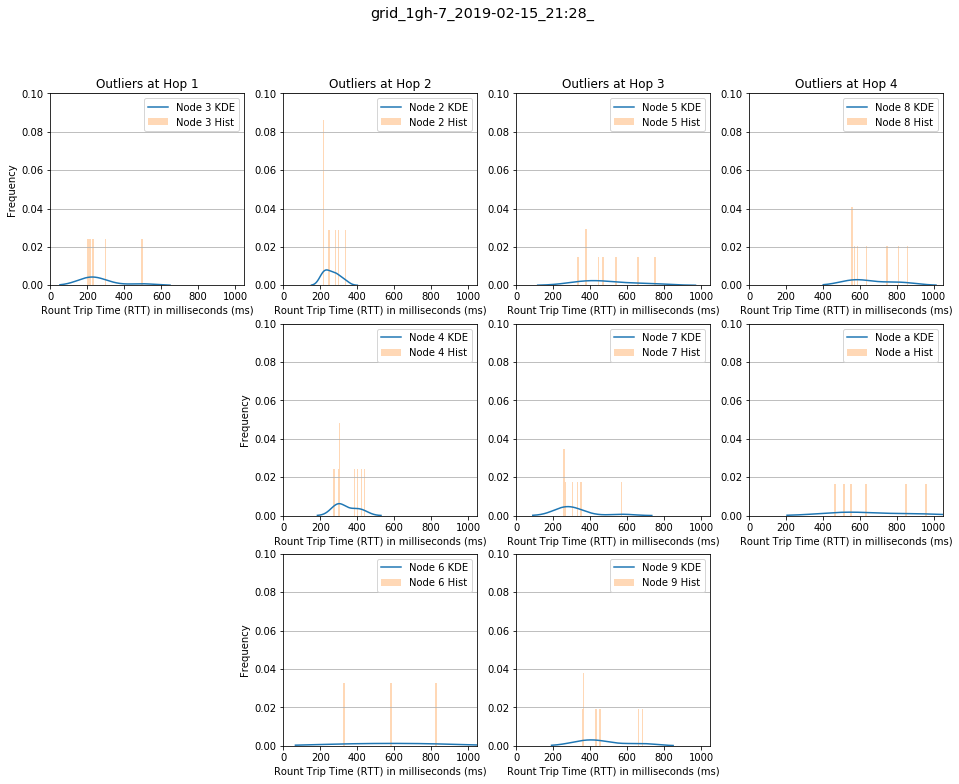

In [4]:
for row in plots:
    nodes, packets_node = trace_analysis.process_cooja2_traces(row[0], row[1])
    outliers = trace_analysis.compute_outliers_by_node(packets_node)
    plots_analysis.plot_histograms_outliers_hops_nodes(nodes, outliers, 1050, 0.1, row[1])

IQR outliers

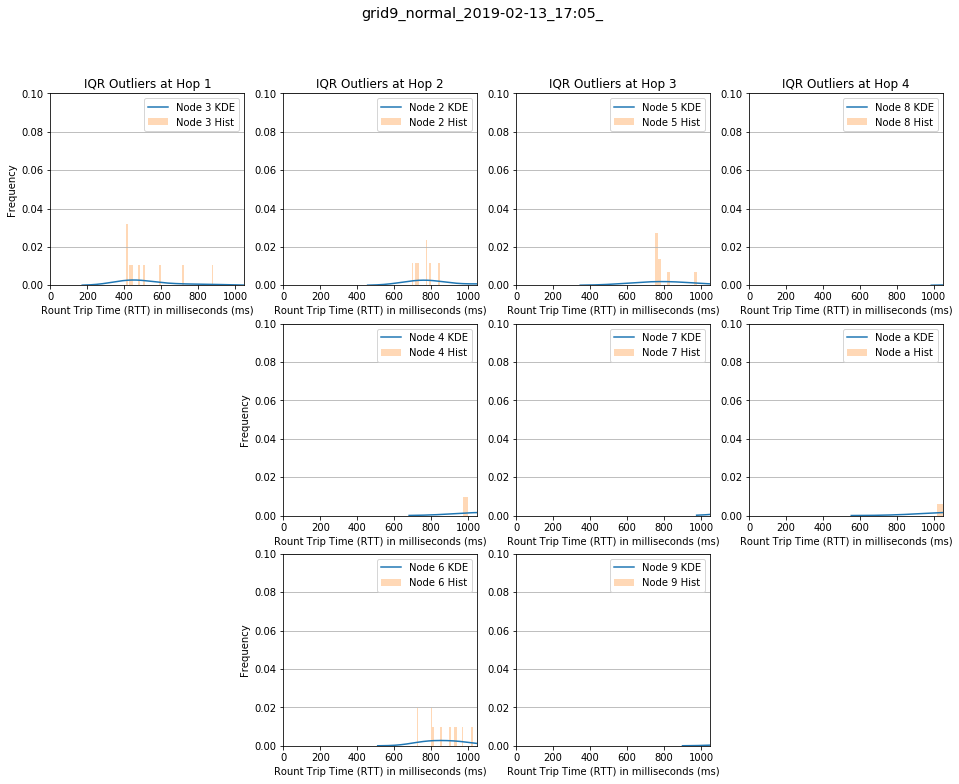

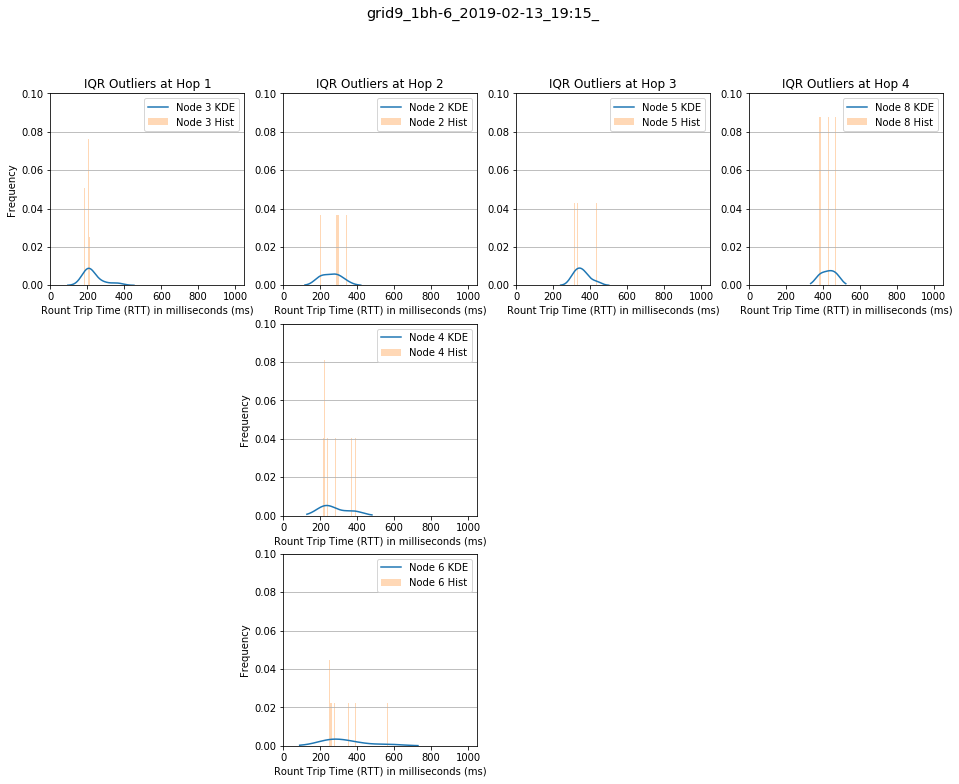

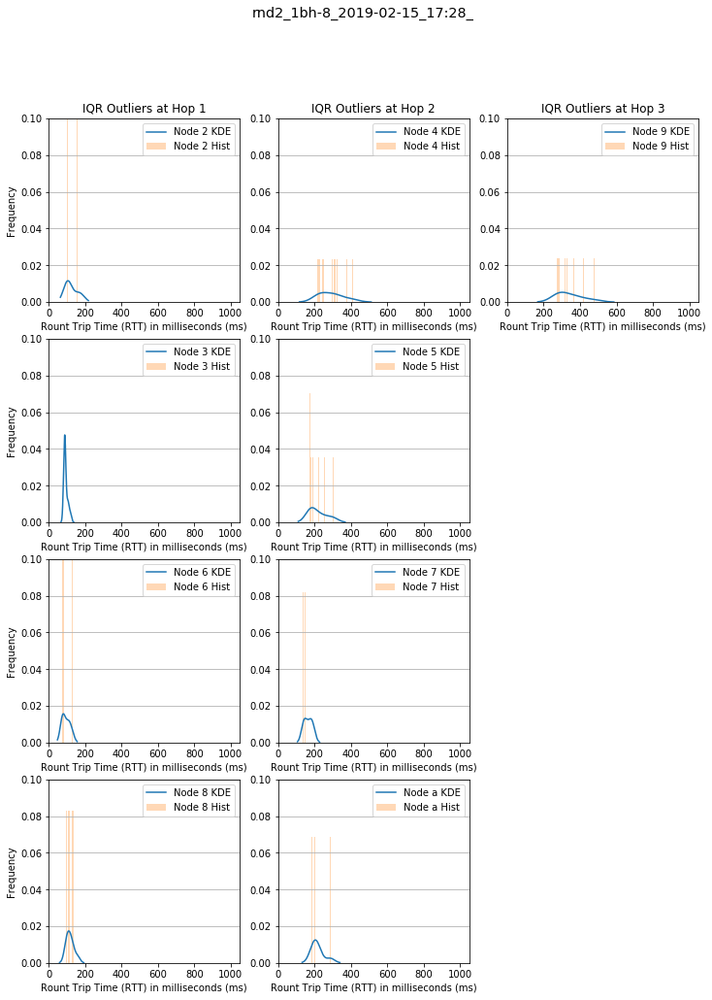

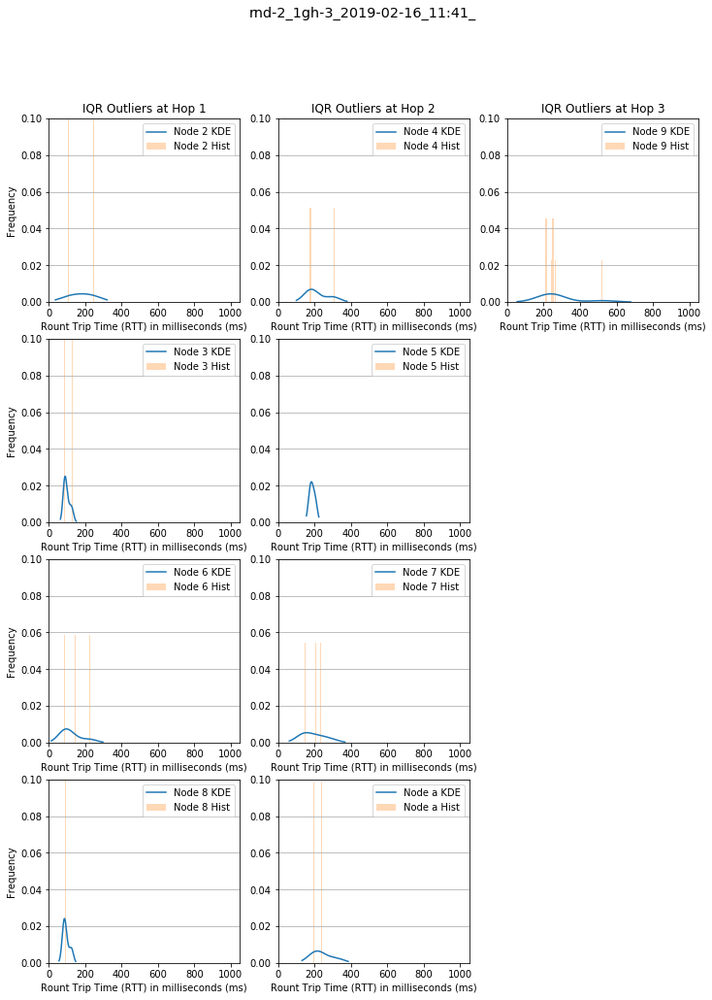

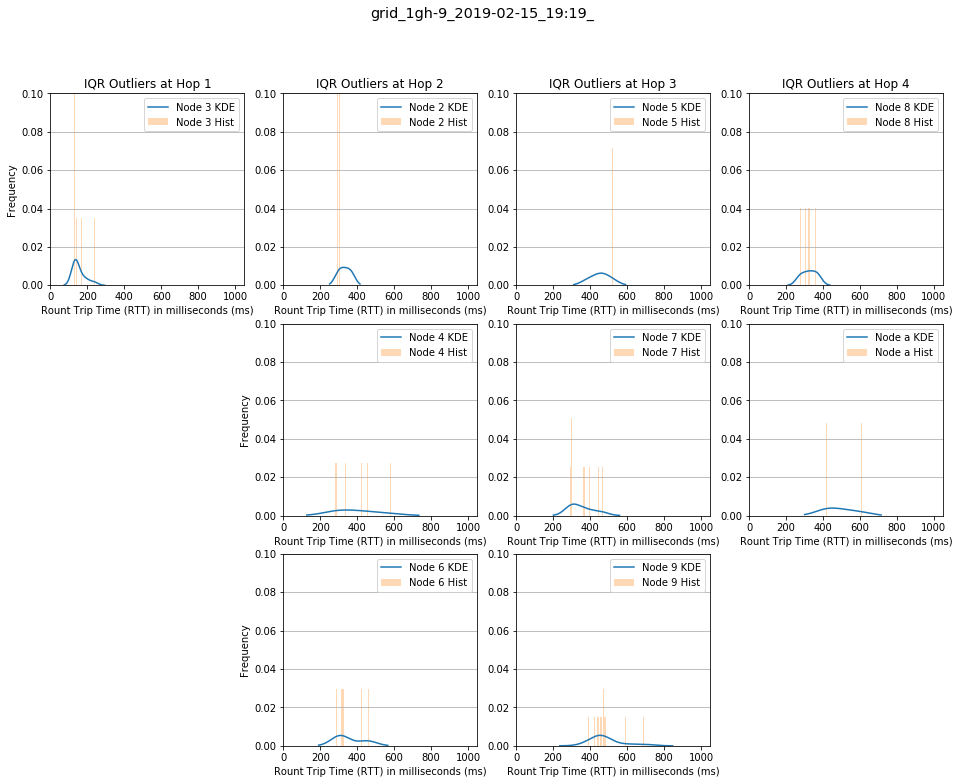

...

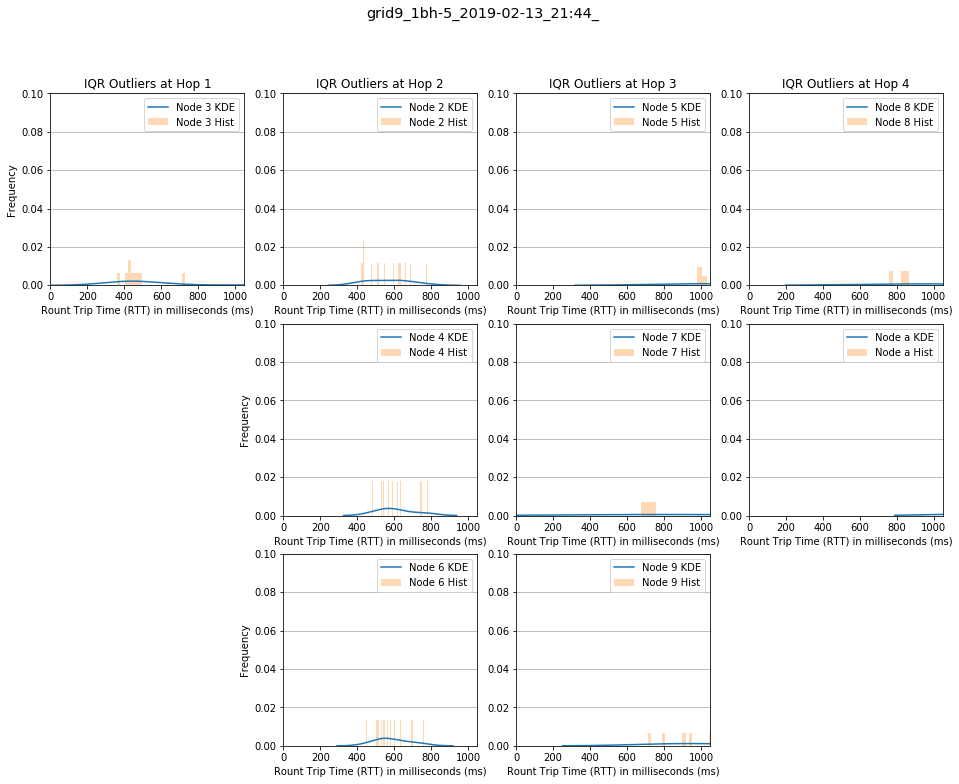

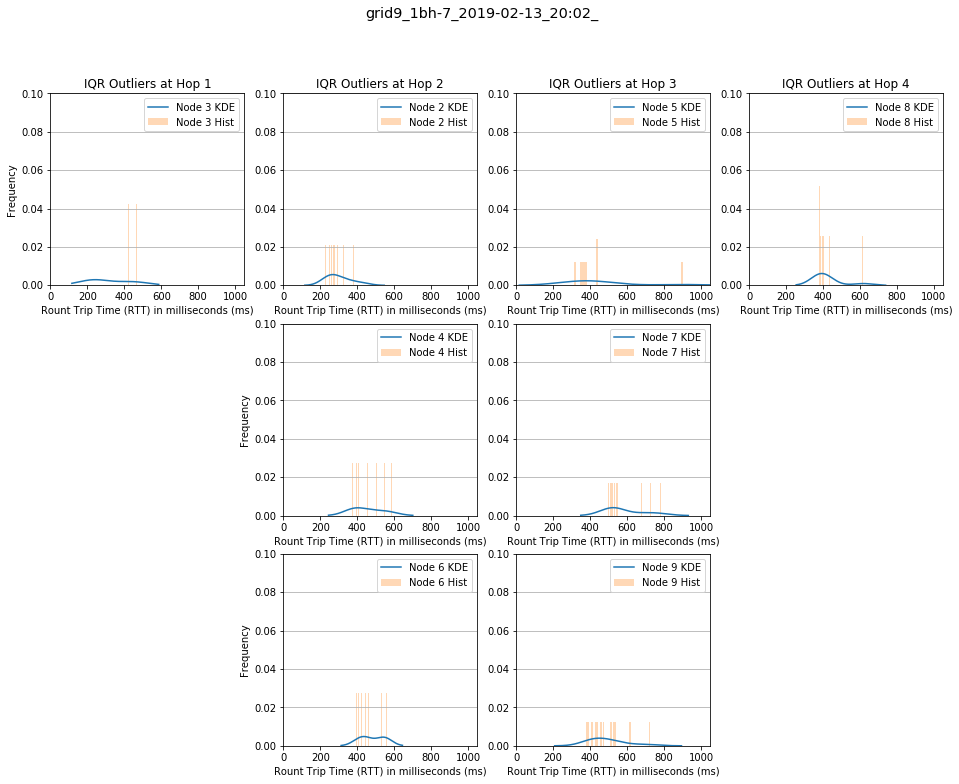

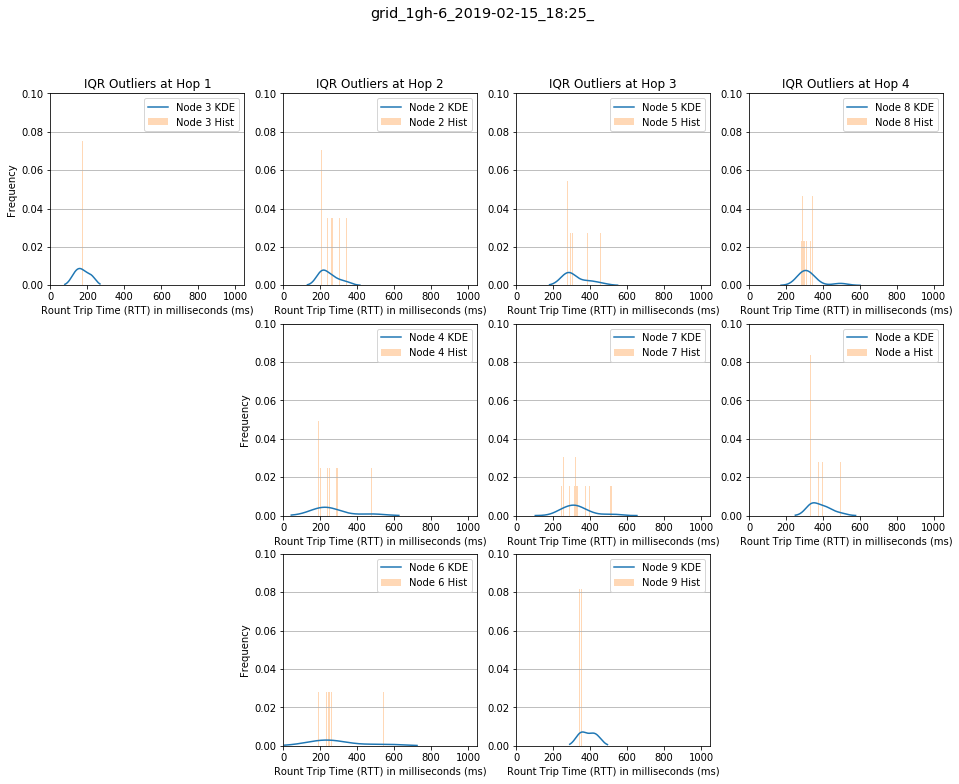

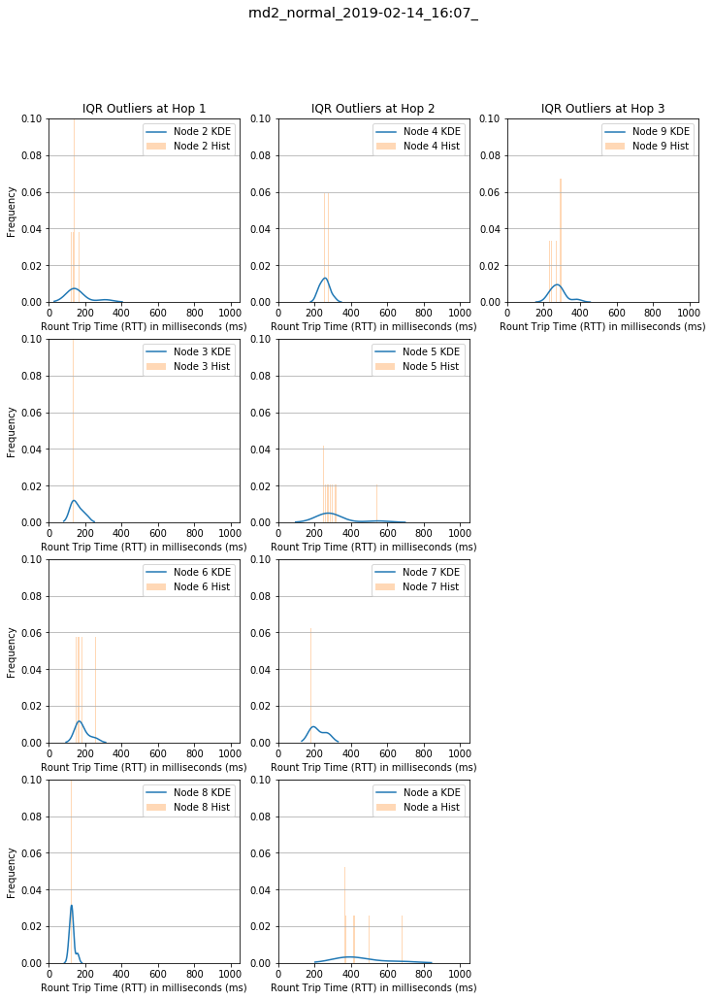

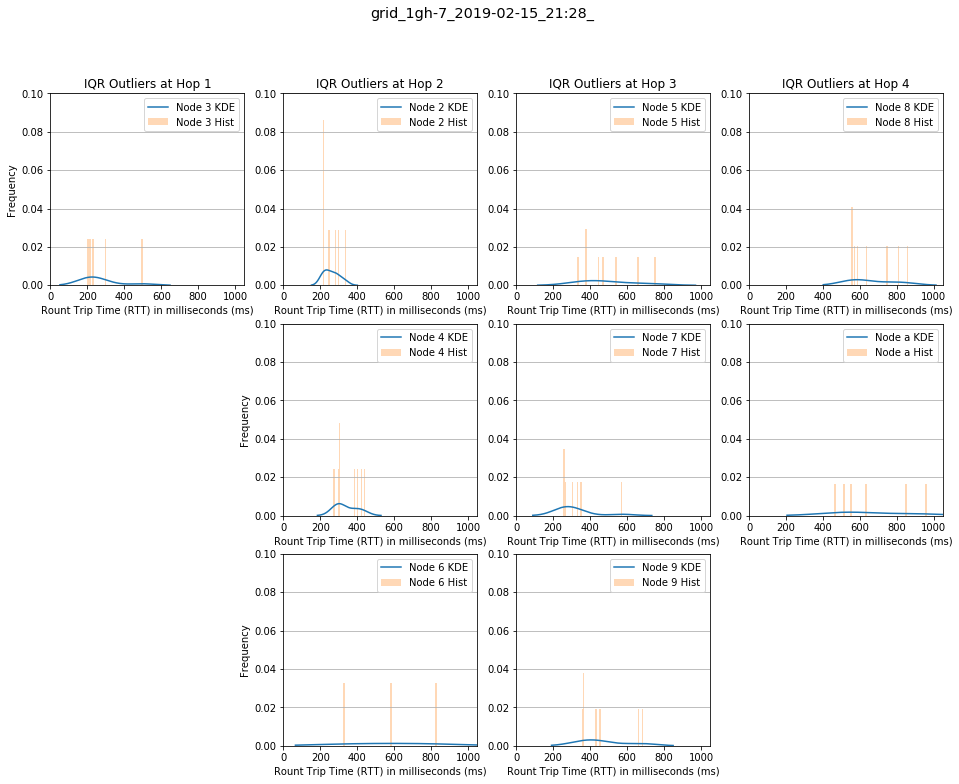

In [5]:
for row in plots:
    nodes, packets_node = trace_analysis.process_cooja2_traces(row[0], row[1])
    iqr_outliers = trace_analysis.compute_outliers_by_node(packets_node)
    plots_analysis.plot_histograms_iqr_outliers_hops_nodes(nodes, iqr_outliers, 1050, 0.1, row[1])

# Statistics

Compute statistics for each node in every experiment

In [5]:
stats = None

for row in plots:
    label = 'Normal'
    # Assign a label
    if row[1].find('gh') >= 0:
        label = 'GH'
    elif row[1].find('bh') >= 0:
        label = 'BH'
        
    nodes, packets_node = trace_analysis.process_cooja2_traces(row[0], row[1])
    clean = trace_analysis.separate_outliers_by_node(packets_node)
    experiment = row[1]
    
    # Update stats
    if stats is None:
        stats = trace_statistics.compute_labeled_statistics(nodes, clean, label, experiment)
    else:
        stats = pd.concat([stats, trace_statistics.compute_labeled_statistics(nodes, clean, label, experiment)])

stats = stats.sort_values(by=['experiment', 'hop']).reset_index(drop=True)


In [6]:
stats

,node_id,experiment,count,mean,var,std,hop,min,max,loss,outliers,label
0,aaaa::212:7403:3:303:,grid9_1bh-3_2019-02-13_16:28_,179,111.838547,5860.165303,76.551717,1,38.4,388.0,0.105,11,BH
1,aaaa::212:7403:3:303:,grid9_1bh-3_2019-02-13_22:05_,184,64.265217,767.641516,27.706344,1,35.2,184.0,0.080,11,BH
2,aaaa::212:7403:3:303:,grid9_1bh-5_2019-02-13_15:31_,175,84.670286,2495.291871,49.952897,1,29.0,238.0,0.125,11,BH
3,aaaa::212:7402:2:202:,grid9_1bh-5_2019-02-13_15:31_,187,100.954545,1761.499697,41.970224,2,57.5,319.0,0.065,14,BH
4,aaaa::212:7406:6:606:,grid9_1bh-5_2019-02-13_15:31_,176,126.023295,1470.871054,38.351937,2,76.9,307.0,0.120,7,BH
5,aaaa::212:7404:4:404:,grid9_1bh-5_2019-02-13_15:31_,156,179.128205,13053.307070,114.251070,2,60.9,504.0,0.220,9,BH
6,aaaa::212:7409:9:909:,grid9_1bh-5_2019-02-13_15:31_,145,282.372414,9218.263123,96.011786,3,112.0,508.0,0.275,8,BH
7,aaaa::212:7407:7:707:,grid9_1bh-5_2019-02-13_15:31_,168,264.065476,20163.941795,141.999795,3,133.0,814.0,0.160,9,BH
8,aaaa::212:7405:5:505:,grid9_1bh-5_2019-02-13_15:31_,184,187.277174,2395.403629,48.942861,3,138.0,430.0,0.080,9,BH
9,aaaa::212:7408:8:808:,grid9_1bh-5_2019-02-13_15:31_,170,296.841176,10034.808945,100.173894,4,151.0,572.0,0.150,8,BH


Let us analyse the correlation between the extracted features

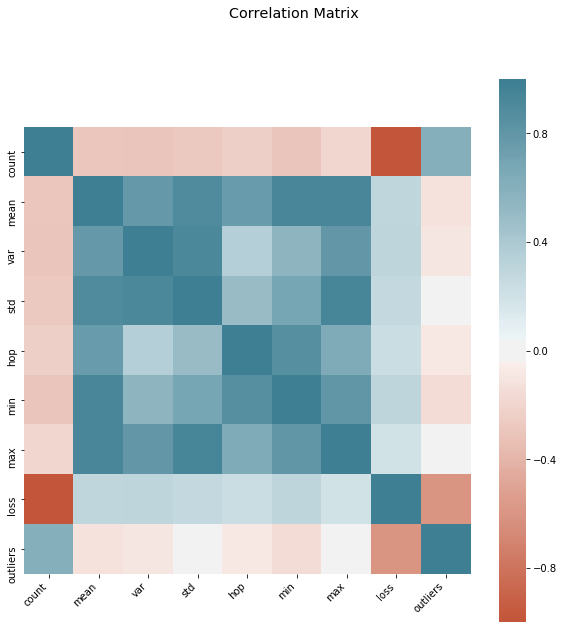

In [7]:
plots_analysis.plot_correlation_matrix(stats[stats.columns[2:-1]], 'grid9')

Contruct a table containing the loss of each node of an experiment

In [6]:
trace_statistics.compute_labeled_statistics_by_network(stats, 'loss', 9)

,experiment,label,1,2,3,4,5,6,7,8,9
0,grid9_1bh-3_2019-02-13_16:28_,BH,0.105,9.223372e+18,9.223372e+18,9.223372e+18,9.223372e+18,9.223372e+18,9.223372e+18,9.223372e+18,9.223372e+18
1,grid9_1bh-3_2019-02-13_22:05_,BH,0.080,9.223372e+18,9.223372e+18,9.223372e+18,9.223372e+18,9.223372e+18,9.223372e+18,9.223372e+18,9.223372e+18
2,grid9_1bh-5_2019-02-13_15:31_,BH,0.125,6.500000e-02,1.200000e-01,2.200000e-01,2.750000e-01,1.600000e-01,8.000000e-02,1.500000e-01,2.200000e-01
3,grid9_1bh-5_2019-02-13_21:44_,BH,0.240,2.000000e-01,1.550000e-01,1.600000e-01,8.000000e-02,2.050000e-01,8.000000e-02,1.500000e-01,1.150000e-01
4,grid9_1bh-6_2019-02-13_12:59_,BH,0.215,1.350000e-01,1.300000e-01,2.150000e-01,8.000000e-02,4.500000e-02,2.100000e-01,2.400000e-01,9.223372e+18
5,grid9_1bh-6_2019-02-13_19:15_,BH,0.175,6.000000e-02,5.000000e-02,6.000000e-02,5.500000e-02,2.200000e-01,9.223372e+18,9.223372e+18,9.223372e+18
6,grid9_1bh-7_2019-02-13_15:08_,BH,0.985,1.150000e-01,1.000000e-01,1.100000e-01,8.000000e-02,1.150000e-01,9.500000e-02,1.300000e-01,6.000000e-02
7,grid9_1bh-7_2019-02-13_20:02_,BH,0.370,1.650000e-01,1.450000e-01,7.500000e-02,3.500000e-02,8.000000e-02,2.300000e-01,3.750000e-01,9.223372e+18
8,grid9_1bh-9_2019-02-13_15:57_,BH,0.055,2.250000e-01,1.000000e-01,2.300000e-01,7.000000e-02,6.000000e-02,9.000000e-02,6.000000e-02,3.000000e-02
9,grid9_1bh-9_2019-02-13_19:35_,BH,0.125,1.250000e-01,7.000000e-02,2.250000e-01,9.750000e-01,1.300000e-01,4.000000e-02,3.500000e-02,2.650000e-01


## T-Test

We perform a t-test on different windows sizes

In [ ]:
plots = set()
with open('traces/traces.csv') as csv_file:
    csv_reader = csv.reader(csv_file, delimiter=',')
    line_count = 0
    for row in csv_reader:
        if line_count == 0:
            line_count += 1
            continue
        else:
            plots.add((row[1], row[2]))
            
rnd1 = []
rnd2 = []
plot = []
for trace in plots:
    if trace[0].find('rnd-1') >= 0:
        rnd1.append(trace)
    elif trace[0].find('rnd-2') >= 0:
        rnd2.append(trace)
    else:
        plot.append(trace)

### Grid Topology

In [ ]:
t_test = None
for row in plot:        
    nodes, packets_node = trace_analysis.process_cooja2_traces(row[0], row[1])

    if t_test is None:
        t_test = trace_statistics.compute_one_sample_t_test(packets_node, 25, row[1])
    else:
        t_test = pd.concat([t_test, trace_statistics.compute_one_sample_t_test(packets_node, 25, row[1])])

t_test.sort_values(by=['experiment', 'node_id']).reset_index(drop=True)

In [ ]:
t_test = None
for row in plot:        
    nodes, packets_node = trace_analysis.process_cooja2_traces(row[0], row[1])

    if t_test is None:
        t_test = trace_statistics.compute_one_sample_t_test(packets_node, 50, row[1])
    else:
        t_test = pd.concat([t_test, trace_statistics.compute_one_sample_t_test(packets_node, 50, row[1])])

t_test.sort_values(by=['experiment', 'node_id']).reset_index(drop=True)

In [ ]:
t_test = None
for row in plot:        
    nodes, packets_node = trace_analysis.process_cooja2_traces(row[0], row[1])

    if t_test is None:
        t_test = trace_statistics.compute_one_sample_t_test(packets_node, 100, row[1])
    else:
        t_test = pd.concat([t_test, trace_statistics.compute_one_sample_t_test(packets_node, 100, row[1])])

t_test.sort_values(by=['experiment', 'node_id']).reset_index(drop=True)

### Random 1 Topology

In [ ]:
t_test = None
for row in rnd1:        
    nodes, packets_node = trace_analysis.process_cooja2_traces(row[0], row[1])

    if t_test is None:
        t_test = trace_statistics.compute_one_sample_t_test(packets_node, 25, row[1])
    else:
        t_test = pd.concat([t_test, trace_statistics.compute_one_sample_t_test(packets_node, 25, row[1])])

t_test.sort_values(by=['experiment', 'node_id']).reset_index(drop=True)

In [ ]:
t_test = None
for row in rnd1:        
    nodes, packets_node = trace_analysis.process_cooja2_traces(row[0], row[1])

    if t_test is None:
        t_test = trace_statistics.compute_one_sample_t_test(packets_node, 50, row[1])
    else:
        t_test = pd.concat([t_test, trace_statistics.compute_one_sample_t_test(packets_node, 50, row[1])])

t_test.sort_values(by=['experiment', 'node_id']).reset_index(drop=True)

In [ ]:
t_test = None
for row in rnd1:        
    nodes, packets_node = trace_analysis.process_cooja2_traces(row[0], row[1])

    if t_test is None:
        t_test = trace_statistics.compute_one_sample_t_test(packets_node, 100, row[1])
    else:
        t_test = pd.concat([t_test, trace_statistics.compute_one_sample_t_test(packets_node, 100, row[1])])

t_test.sort_values(by=['experiment', 'node_id']).reset_index(drop=True)

### Random 2 Topology


In [ ]:
t_test = None
for row in rnd2:        
    nodes, packets_node = trace_analysis.process_cooja2_traces(row[0], row[1])

    if t_test is None:
        t_test = trace_statistics.compute_one_sample_t_test(packets_node, 25, row[1])
    else:
        t_test = pd.concat([t_test, trace_statistics.compute_one_sample_t_test(packets_node, 25, row[1])])

t_test.sort_values(by=['experiment', 'node_id']).reset_index(drop=True)

In [ ]:
t_test = None
for row in rnd2:        
    nodes, packets_node = trace_analysis.process_cooja2_traces(row[0], row[1])

    if t_test is None:
        t_test = trace_statistics.compute_one_sample_t_test(packets_node, 50, row[1])
    else:
        t_test = pd.concat([t_test, trace_statistics.compute_one_sample_t_test(packets_node, 50, row[1])])

t_test.sort_values(by=['experiment', 'node_id']).reset_index(drop=True)

In [ ]:
t_test = None
for row in rnd2:        
    nodes, packets_node = trace_analysis.process_cooja2_traces(row[0], row[1])

    if t_test is None:
        t_test = trace_statistics.compute_one_sample_t_test(packets_node, 100, row[1])
    else:
        t_test = pd.concat([t_test, trace_statistics.compute_one_sample_t_test(packets_node, 100, row[1])])

t_test.sort_values(by=['experiment', 'node_id']).reset_index(drop=True)

## Kolmogorov-Smirnov Test

We perform a Kolmogorov-Smirnov-test on different windows sizes

### Grid Topology

In [ ]:
t_test = None
for row in plot:        
    nodes, packets_node = trace_analysis.process_cooja2_traces(row[0], row[1])
    
    if t_test is None:
        t_test = trace_statistics.compute_kolmogorov_smirnov_2_samp(packets_node, 25, row[1])
    else:
        t_test = pd.concat([t_test, trace_statistics.compute_kolmogorov_smirnov_2_samp(packets_node, 25, row[1])])
        
t_test.sort_values(by=['experiment', 'node_id']).reset_index(drop=True)


In [ ]:
t_test = None
for row in plot:        
    nodes, packets_node = trace_analysis.process_cooja2_traces(row[0], row[1])
    
    if t_test is None:
        t_test = trace_statistics.compute_kolmogorov_smirnov_2_samp(packets_node, 50, row[1])
    else:
        t_test = pd.concat([t_test, trace_statistics.compute_kolmogorov_smirnov_2_samp(packets_node, 50, row[1])])
        
t_test.sort_values(by=['experiment', 'node_id']).reset_index(drop=True)


In [ ]:
t_test = None
for row in plot:        
    nodes, packets_node = trace_analysis.process_cooja2_traces(row[0], row[1])
    
    if t_test is None:
        t_test = trace_statistics.compute_kolmogorov_smirnov_2_samp(packets_node, 100, row[1])
    else:
        t_test = pd.concat([t_test, trace_statistics.compute_kolmogorov_smirnov_2_samp(packets_node, 100, row[1])])
        
t_test.sort_values(by=['experiment', 'node_id']).reset_index(drop=True)


### Random 1 Topology

In [ ]:
t_test = None
for row in plots:        
    nodes, packets_node = trace_analysis.process_cooja2_traces(row[0], row[1])
    
    if t_test is None:
        t_test = trace_statistics.compute_kolmogorov_smirnov_2_samp(packets_node, 25, row[1])
    else:
        t_test = pd.concat([t_test, trace_statistics.compute_kolmogorov_smirnov_2_samp(packets_node, 25, row[1])])
        
t_test.sort_values(by=['experiment', 'node_id']).reset_index(drop=True)


In [ ]:
t_test = None
for row in rnd1:        
    nodes, packets_node = trace_analysis.process_cooja2_traces(row[0], row[1])
    
    if t_test is None:
        t_test = trace_statistics.compute_kolmogorov_smirnov_2_samp(packets_node, 50, row[1])
    else:
        t_test = pd.concat([t_test, trace_statistics.compute_kolmogorov_smirnov_2_samp(packets_node, 50, row[1])])
        
t_test.sort_values(by=['experiment', 'node_id']).reset_index(drop=True)


In [ ]:
t_test = None
for row in rnd1:        
    nodes, packets_node = trace_analysis.process_cooja2_traces(row[0], row[1])
    
    if t_test is None:
        t_test = trace_statistics.compute_kolmogorov_smirnov_2_samp(packets_node, 100, row[1])
    else:
        t_test = pd.concat([t_test, trace_statistics.compute_kolmogorov_smirnov_2_samp(packets_node, 100, row[1])])
        
t_test.sort_values(by=['experiment', 'node_id']).reset_index(drop=True)


### Random 2 Topology

In [ ]:
t_test = None
for row in rnd2:        
    nodes, packets_node = trace_analysis.process_cooja2_traces(row[0], row[1])
    
    if t_test is None:
        t_test = trace_statistics.compute_kolmogorov_smirnov_2_samp(packets_node, 25, row[1])
    else:
        t_test = pd.concat([t_test, trace_statistics.compute_kolmogorov_smirnov_2_samp(packets_node, 25, row[1])])
        
t_test.sort_values(by=['experiment', 'node_id']).reset_index(drop=True)


In [ ]:
t_test = None
for row in rnd2:        
    nodes, packets_node = trace_analysis.process_cooja2_traces(row[0], row[1])
    
    if t_test is None:
        t_test = trace_statistics.compute_kolmogorov_smirnov_2_samp(packets_node, 50, row[1])
    else:
        t_test = pd.concat([t_test, trace_statistics.compute_kolmogorov_smirnov_2_samp(packets_node, 50, row[1])])
        
t_test.sort_values(by=['experiment', 'node_id']).reset_index(drop=True)


In [ ]:
t_test = None
for row in rnd2:        
    nodes, packets_node = trace_analysis.process_cooja2_traces(row[0], row[1])
    
    if t_test is None:
        t_test = trace_statistics.compute_kolmogorov_smirnov_2_samp(packets_node, 100, row[1])
    else:
        t_test = pd.concat([t_test, trace_statistics.compute_kolmogorov_smirnov_2_samp(packets_node, 100, row[1])])
        
t_test.sort_values(by=['experiment', 'node_id']).reset_index(drop=True)
